<a href="https://colab.research.google.com/github/butlerbt/SegmentingBuildings/blob/colab/model_acc_665946_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [19]:
from google.colab import drive 
drive.mount('/content/drive/')

ValueError: ignored

In [2]:
!curl https://course.fast.ai/setup/colab | bash

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   322  100   322    0     0   1769      0 --:--:-- --:--:-- --:--:--  1769
Updating fastai...
Done.


In [0]:
from fastai.vision import *
from fastai.callbacks import *

In [4]:
from fastai.utils.collect_env import *
show_install(True)



```text
=== Software === 
python        : 3.6.9
fastai        : 1.0.60
fastprogress  : 0.2.2
torch         : 1.3.1
nvidia driver : 418.67
torch cuda    : 10.1.243 / is available
torch cudnn   : 7603 / is enabled

=== Hardware === 
nvidia gpus   : 1
torch devices : 1
  - gpu0      : 15079MB | Tesla T4

=== Environment === 
platform      : Linux-4.14.137+-x86_64-with-Ubuntu-18.04-bionic
distro        : #1 SMP Thu Aug 8 02:47:02 PDT 2019
conda env     : Unknown
python        : /usr/bin/python3
sys.path      : 
/env/python
/usr/lib/python36.zip
/usr/lib/python3.6
/usr/lib/python3.6/lib-dynload
/usr/local/lib/python3.6/dist-packages
/usr/lib/python3/dist-packages
/usr/local/lib/python3.6/dist-packages/IPython/extensions
/root/.ipython

Tue Jan 28 18:50:02 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.44       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+---------

In [24]:
path = Path('drive/My Drive/seg_building_foots/data/processed')
path.ls()

[PosixPath('drive/My Drive/seg_building_foots/data/processed/images-256-acc-665946'),
 PosixPath('drive/My Drive/seg_building_foots/data/processed/masks-256-acc-665946')]

In [0]:
path_lbl = path/'masks-256-acc-665946'
path_img = path/'images-256-acc-665946'

In [26]:
fnames = get_image_files(path_img)
lbl_names = get_image_files(path_lbl)
print(len(fnames), len(lbl_names))
fnames[:3], lbl_names[:3]

381 459


([PosixPath('drive/My Drive/seg_building_foots/data/processed/images-256-acc-665946/acc665946train_19_261799_253929.png'),
  PosixPath('drive/My Drive/seg_building_foots/data/processed/images-256-acc-665946/acc665946validation_19_261807_253941.png'),
  PosixPath('drive/My Drive/seg_building_foots/data/processed/images-256-acc-665946/acc665946train_19_261799_253915.png')],
 [PosixPath('drive/My Drive/seg_building_foots/data/processed/masks-256-acc-665946/acc665946train_19_261802_253909_mask.png'),
  PosixPath('drive/My Drive/seg_building_foots/data/processed/masks-256-acc-665946/acc665946train_19_261796_253916_mask.png'),
  PosixPath('drive/My Drive/seg_building_foots/data/processed/masks-256-acc-665946/acc665946train_19_261795_253920_mask.png')])

In [0]:
get_y_fn = lambda x: path_lbl/f'{x.stem}_mask.png'

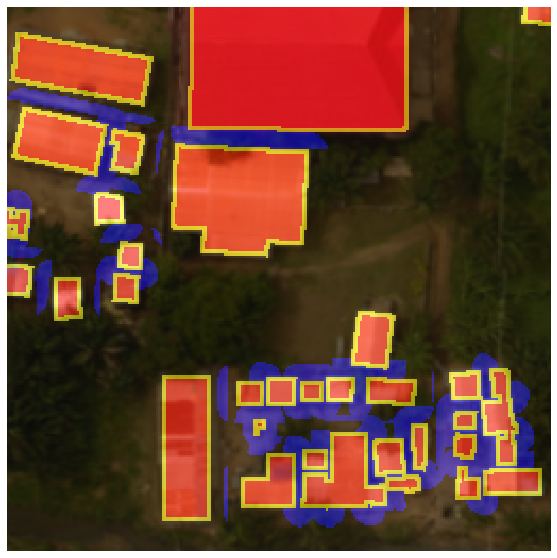

In [30]:
# test that masks are opening correctly with open_mask() settings
img_f = fnames[90]
img = open_image(img_f)
mask = open_mask(get_y_fn(img_f), convert_mode='RGB', div=False)

fig,ax = plt.subplots(1,1, figsize=(10,10))
img.show(ax=ax)
mask.show(ax=ax, alpha=0.5)

In [31]:
# define the valdation set by fn prefix
holdout_grids = ['cc665946validation_']
valid_idx = [i for i,o in enumerate(fnames) if any(c in str(o) for c in holdout_grids)]
print(len(valid_idx))

71


In [0]:
# subclassing SegmentationLabelList to set open_mask(fn, div=True, convert_mode='RGB') for 3 channel target masks

class SegLabelListCustom(SegmentationLabelList):
    def open(self, fn): return open_mask(fn, div=True, convert_mode='RGB')
    
class SegItemListCustom(SegmentationItemList):
    _label_cls = SegLabelListCustom

In [0]:
# the classes corresponding to each channel
codes = np.array(['Footprint','Boundary','Contact'])

size = 256
bs = 16

In [0]:
# define image transforms for data augmentation and create databunch. More about image tfms and data aug at https://docs.fast.ai/vision.transform.html 
tfms = get_transforms(flip_vert=True, max_warp=0.1, max_rotate=20, max_zoom=2, max_lighting=0.3)

src = (SegItemListCustom.from_folder(path_img)
        .split_by_idx(valid_idx)
        .label_from_func(get_y_fn, classes=codes))

data = (src.transform(tfms, size=size, tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats))

In [35]:
data

ImageDataBunch;

Train: LabelList (310 items)
x: SegItemListCustom
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: SegLabelListCustom
ImageSegment (3, 256, 256),ImageSegment (3, 256, 256),ImageSegment (3, 256, 256),ImageSegment (3, 256, 256),ImageSegment (3, 256, 256)
Path: drive/My Drive/seg_building_foots/data/processed/images-256-acc-665946;

Valid: LabelList (71 items)
x: SegItemListCustom
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: SegLabelListCustom
ImageSegment (3, 256, 256),ImageSegment (3, 256, 256),ImageSegment (3, 256, 256),ImageSegment (3, 256, 256),ImageSegment (3, 256, 256)
Path: drive/My Drive/seg_building_foots/data/processed/images-256-acc-665946;

Test: None

In [0]:
def show_3ch(imgitem, figsize=(10,5)):
    fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=figsize)
    ax1.imshow(np.asarray(imgitem.data[0,None])[0])
    ax2.imshow(np.asarray(imgitem.data[1,None])[0])
    ax3.imshow(np.asarray(imgitem.data[2,None])[0])
    
    ax1.set_title('Footprint')
    ax2.set_title('Boundary')
    ax3.set_title('Contact')
    
    plt.show()

drive/My Drive/seg_building_foots/data/processed/images-256-acc-665946/acc665946validation_19_261807_253937.png


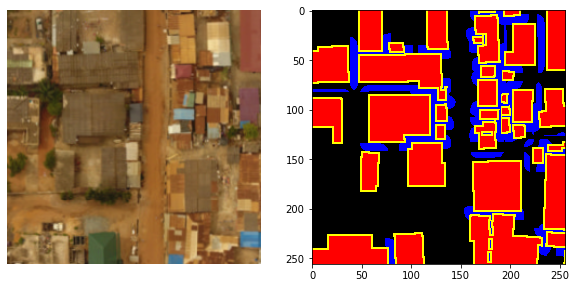

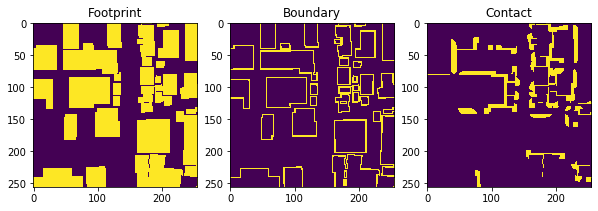

drive/My Drive/seg_building_foots/data/processed/images-256-acc-665946/acc665946validation_19_261808_253940.png


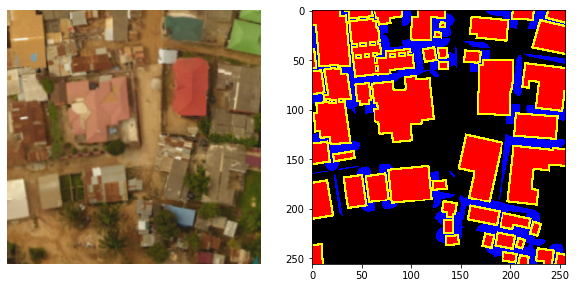

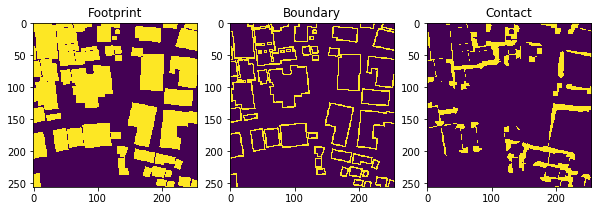

drive/My Drive/seg_building_foots/data/processed/images-256-acc-665946/acc665946validation_19_261808_253942.png


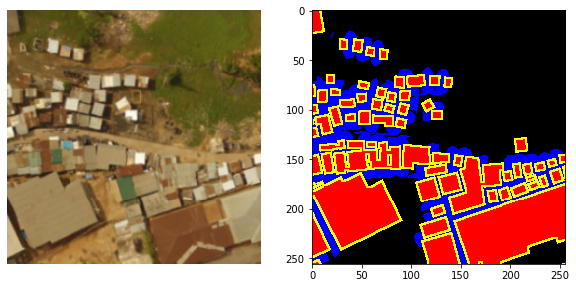

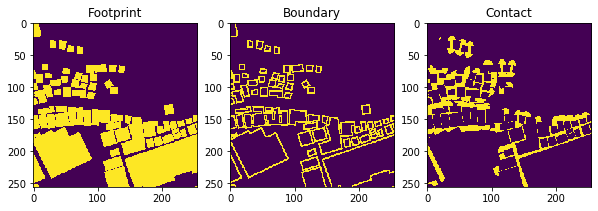

drive/My Drive/seg_building_foots/data/processed/images-256-acc-665946/acc665946validation_19_261804_253939.png


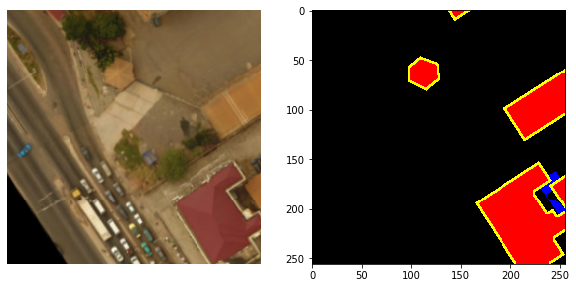

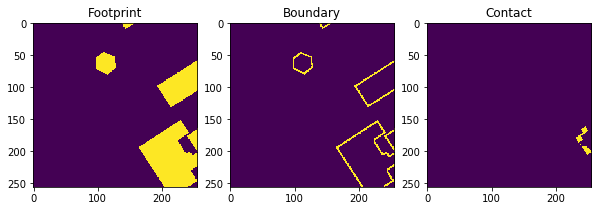

drive/My Drive/seg_building_foots/data/processed/images-256-acc-665946/acc665946validation_19_261805_253940.png


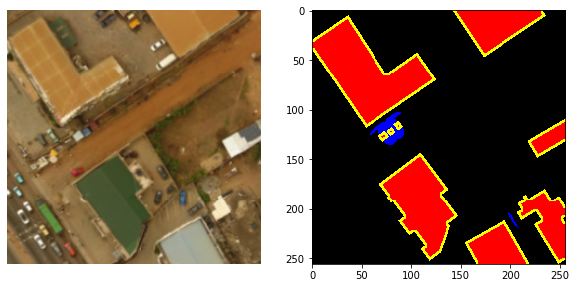

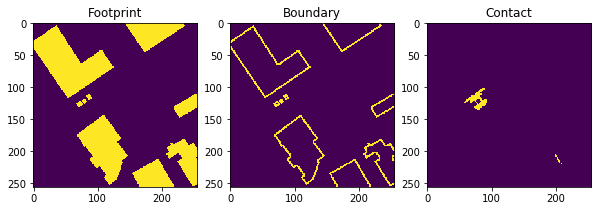

In [37]:
for idx in range(10,15):
    print(data.valid_ds.items[idx])
    fig, (ax1,ax2) = plt.subplots(1,2, figsize=(10,5))
    data.valid_ds.x[idx].show(ax=ax1)
    ax2.imshow(image2np(data.valid_ds.y[idx].data*255))
    plt.show()
    show_3ch(data.valid_ds.y[idx])

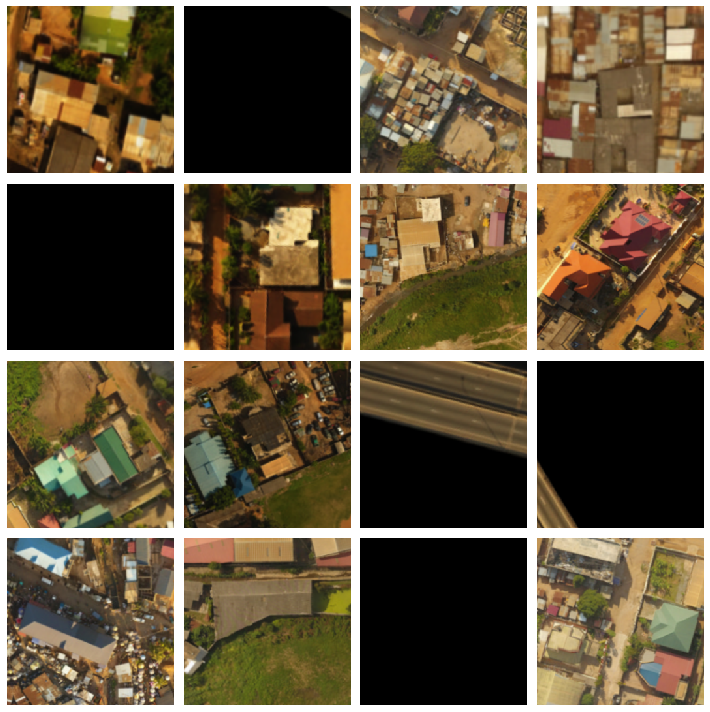

In [38]:
data.show_batch(4,figsize=(10,10), alpha=0.)

In [0]:
import pdb

def dice_loss(input, target):
#     pdb.set_trace()
    smooth = 1.
    input = torch.sigmoid(input)
    iflat = input.contiguous().view(-1).float()
    tflat = target.contiguous().view(-1).float()
    intersection = (iflat * tflat).sum()
    return 1 - ((2. * intersection + smooth) / ((iflat + tflat).sum() +smooth))

# adapted from https://www.kaggle.com/c/tgs-salt-identification-challenge/discussion/65938
class FocalLoss(nn.Module):
    def __init__(self, alpha=1, gamma=2, reduction='mean'):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.binary_cross_entropy_with_logits(inputs, targets.float(), reduction='none')
        pt = torch.exp(-BCE_loss)
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean': return F_loss.mean()
        elif self.reduction == 'sum': return F_loss.sum()
        else: return F_loss

class DiceLoss(nn.Module):
    def __init__(self, reduction='mean'):
        super().__init__()
        self.reduction = reduction
        
    def forward(self, input, target):
        loss = dice_loss(input, target)
        if self.reduction == 'mean': return loss.mean()
        elif self.reduction == 'sum': return loss.sum()
        else: return loss

class MultiChComboLoss(nn.Module):
    def __init__(self, reduction='mean', loss_funcs=[FocalLoss(),DiceLoss()], loss_wts = [1,1], ch_wts=[1,1,1]):
        super().__init__()
        self.reduction = reduction
        self.ch_wts = ch_wts
        self.loss_wts = loss_wts
        self.loss_funcs = loss_funcs 
        
    def forward(self, output, target):
#         pdb.set_trace()
        for loss_func in self.loss_funcs: loss_func.reduction = self.reduction # need to change reduction on fwd pass for loss calc in learn.get_preds(with_loss=True)
        loss = 0
        channels = output.shape[1]
        assert len(self.ch_wts) == channels
        assert len(self.loss_wts) == len(self.loss_funcs)
        for ch_wt,c in zip(self.ch_wts,range(channels)):
            ch_loss=0
            for loss_wt, loss_func in zip(self.loss_wts,self.loss_funcs): 
                ch_loss+=loss_wt*loss_func(output[:,c,None], target[:,c,None])
            loss+=ch_wt*(ch_loss)
        return loss/sum(self.ch_wts)

In [0]:
# calculate metrics on one channel (i.e. ch 0 for building footprints only) or on all 3 channels

def acc_thresh_multich(input:Tensor, target:Tensor, thresh:float=0.5, sigmoid:bool=True, one_ch:int=None)->Rank0Tensor:
    "Compute accuracy when `y_pred` and `y_true` are the same size."
    
#     pdb.set_trace()
    if sigmoid: input = input.sigmoid()
    n = input.shape[0]
    
    if one_ch is not None:
        input = input[:,one_ch,None]
        target = target[:,one_ch,None]
    
    input = input.view(n,-1)
    target = target.view(n,-1)
    return ((input>thresh)==target.byte()).float().mean()

def dice_multich(input:Tensor, targs:Tensor, iou:bool=False, one_ch:int=None)->Rank0Tensor:
    "Dice coefficient metric for binary target. If iou=True, returns iou metric, classic for segmentation problems."
#     pdb.set_trace()
    n = targs.shape[0]
    input = input.sigmoid()
    
    if one_ch is not None:
        input = input[:,one_ch,None]
        targs = targs[:,one_ch,None]
    
    input = (input>0.5).view(n,-1).float()
    targs = targs.view(n,-1).float()

    intersect = (input * targs).sum().float()
    union = (input+targs).sum().float()
    if not iou: return (2. * intersect / union if union > 0 else union.new([1.]).squeeze())
    else: return intersect / (union-intersect+1.0)

In [0]:
# set up metrics to show mean metrics for all channels as well as the building-only metrics (channel 0)

acc_ch0 = partial(acc_thresh_multich, one_ch=0)
dice_ch0 = partial(dice_multich, one_ch=0)
metrics = [acc_thresh_multich, dice_multich, acc_ch0, dice_ch0]

In [42]:
# combo Focal + Dice loss with equal channel wts

learn = unet_learner(data, models.resnet34, model_dir='../models',
                     metrics=metrics, 
                     loss_func=MultiChComboLoss(
                        reduction='mean',
                        loss_funcs=[FocalLoss(gamma=1, alpha=0.95),
                                    DiceLoss(),
                                   ], 
                        loss_wts=[1,1],
                        ch_wts=[1,1,1])
                    )

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:05<00:00, 17.0MB/s]


In [43]:
learn.metrics

[<function __main__.acc_thresh_multich>,
 <function __main__.dice_multich>,
 functools.partial(<function acc_thresh_multich at 0x7f52d07df378>, one_ch=0),
 functools.partial(<function dice_multich at 0x7f52d07df2f0>, one_ch=0)]

In [44]:
learn.loss_func

MultiChComboLoss()

In [45]:
learn.summary()

DynamicUnet
Layer (type)         Output Shape         Param #    Trainable 
Conv2d               [64, 128, 128]       9,408      False     
______________________________________________________________________
BatchNorm2d          [64, 128, 128]       128        True      
______________________________________________________________________
ReLU                 [64, 128, 128]       0          False     
______________________________________________________________________
MaxPool2d            [64, 64, 64]         0          False     
______________________________________________________________________
Conv2d               [64, 64, 64]         36,864     False     
______________________________________________________________________
BatchNorm2d          [64, 64, 64]         128        True      
______________________________________________________________________
ReLU                 [64, 64, 64]         0          False     
__________________________________________________

In [46]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


Min numerical gradient: 6.92E-04
Min loss divided by 10: 3.02E-04


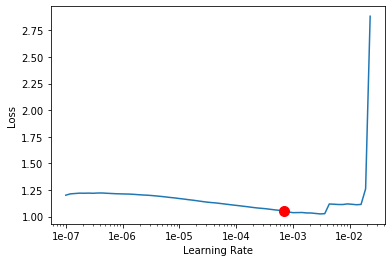

In [47]:
learn.recorder.plot(0,2,suggestion=True)


In [48]:
lr = 1e-3
learn.fit_one_cycle(10, max_lr=lr, 
                    callbacks=[
                        SaveModelCallback(learn,
                                         monitor='dice_multich',
                                         mode='max',
                                         name='acc-665946-focaldice-stage1-best')
                    ]
                    )

epoch,train_loss,valid_loss,acc_thresh_multich,dice_multich,acc_thresh_multich,dice_multich,time
0,0.988440,0.871874,0.893594,0.447697,0.808135,0.554948,00:35
1,0.941929,0.877558,0.866056,0.456850,0.750849,0.537067,00:14
2,0.916453,0.843349,0.884425,0.467512,0.769797,0.551616,00:14
3,0.900867,0.870200,0.881334,0.433554,0.799297,0.507580,00:14
4,0.875843,0.789073,0.875910,0.550682,0.791560,0.641970,00:14
5,0.834857,0.718317,0.895372,0.601540,0.869515,0.727420,00:14
6,0.789790,0.721178,0.919380,0.578060,0.874196,0.679511,00:14
7,0.751752,0.676574,0.922608,0.643975,0.887345,0.750200,00:14
8,0.718258,0.660123,0.915507,0.647490,0.888398,0.760417,00:14
9,0.695402,0.658280,0.917318,0.652075,0.889214,0.763288,00:14


Better model found at epoch 0 with dice_multich value: 0.5549483299255371.
Better model found at epoch 4 with dice_multich value: 0.6419696807861328.
Better model found at epoch 5 with dice_multich value: 0.7274202108383179.
Better model found at epoch 7 with dice_multich value: 0.7501997351646423.
Better model found at epoch 8 with dice_multich value: 0.7604170441627502.
Better model found at epoch 9 with dice_multich value: 0.7632879614830017.


In [49]:
learn.model.eval()
outputs,labels,losses = learn.get_preds(ds_type=DatasetType.Valid,n_batch=3,with_loss=True)
losses.shape

torch.Size([48, 1, 256, 256])

In [51]:
losses_reshaped = torch.mean(losses.view(outputs.shape[0],-1), dim=1)
sorted_idx = torch.argsort(losses_reshaped,descending=True)
losses_reshaped.shape

torch.Size([48])

acc665946validation_19_261807_253942.png
loss: 0.8553943037986755


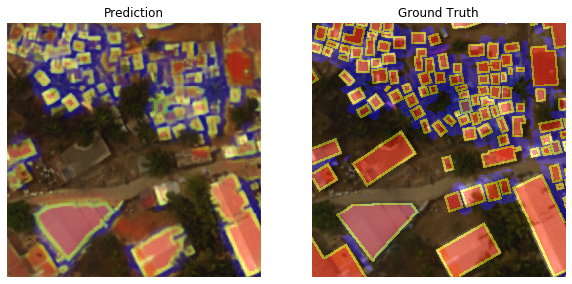

Predicted:


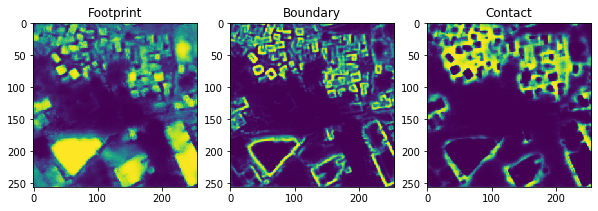

Actual:


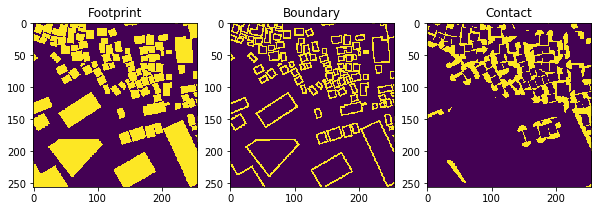

acc665946validation_19_261807_253941.png
loss: 0.8513691425323486


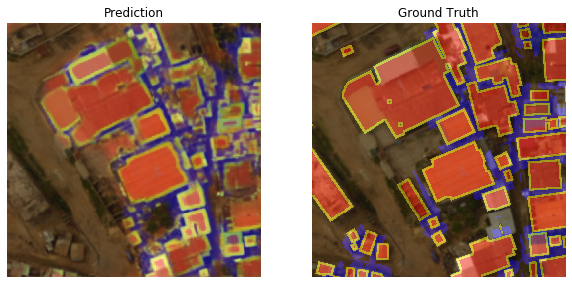

Predicted:


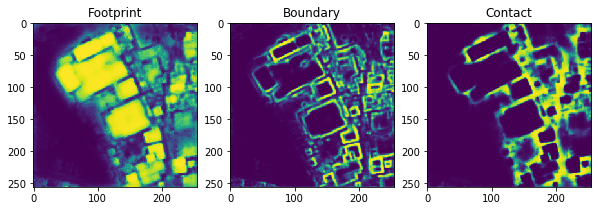

Actual:


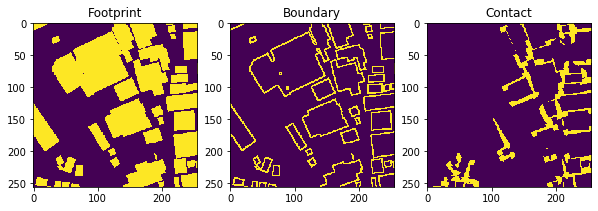

acc665946validation_19_261809_253936.png
loss: 0.8230014443397522


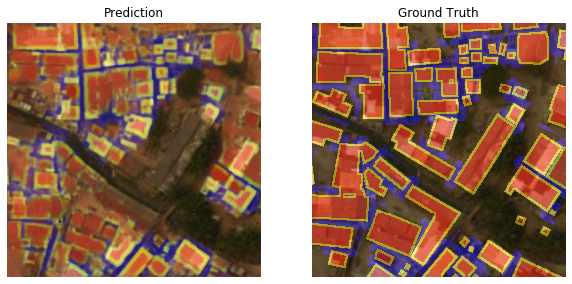

Predicted:


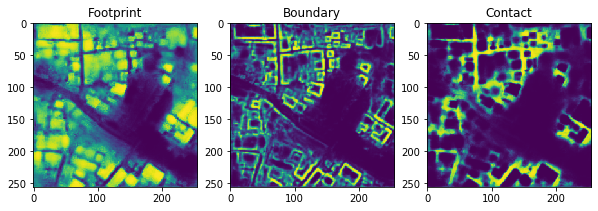

Actual:


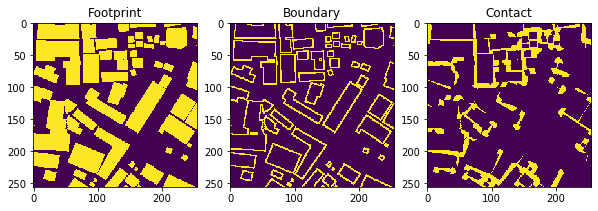

acc665946validation_19_261808_253937.png
loss: 0.8080913424491882


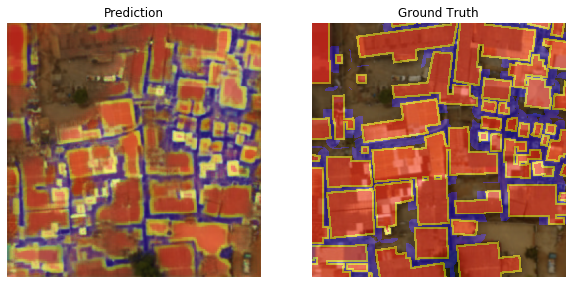

Predicted:


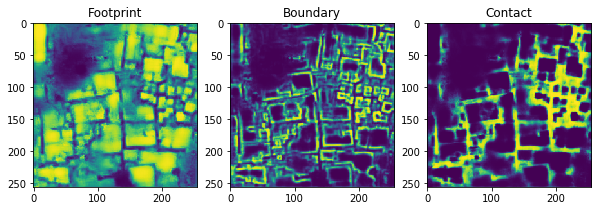

Actual:


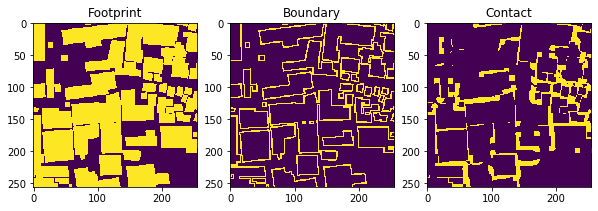

acc665946validation_19_261807_253940.png
loss: 0.7842587232589722


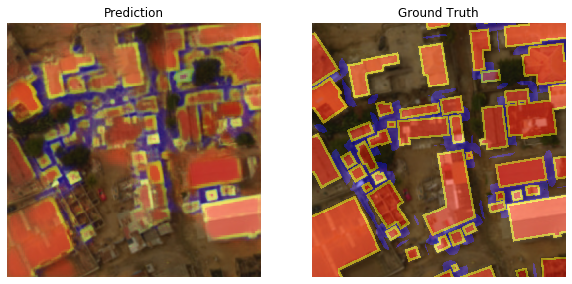

Predicted:


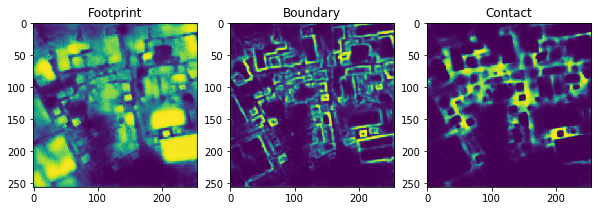

Actual:


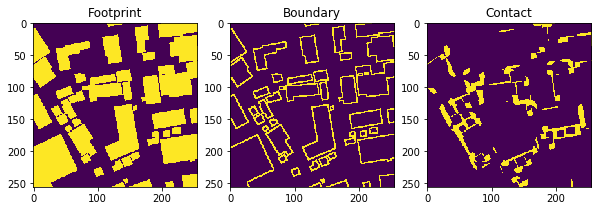

acc665946validation_19_261808_253935.png
loss: 0.7796340584754944


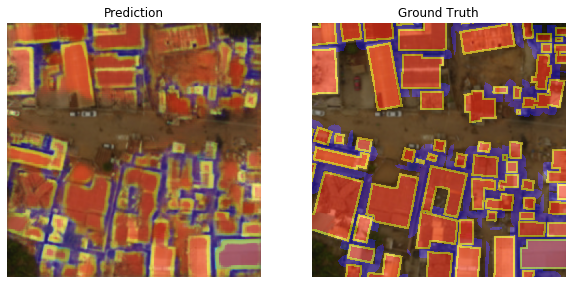

Predicted:


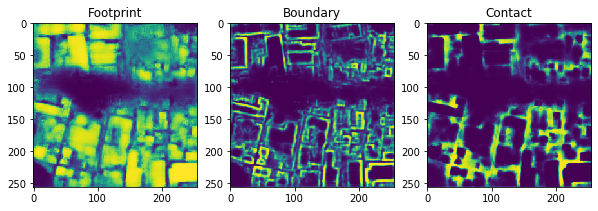

Actual:


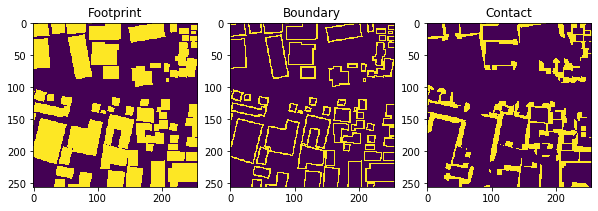

acc665946validation_19_261808_253940.png
loss: 0.7772612571716309


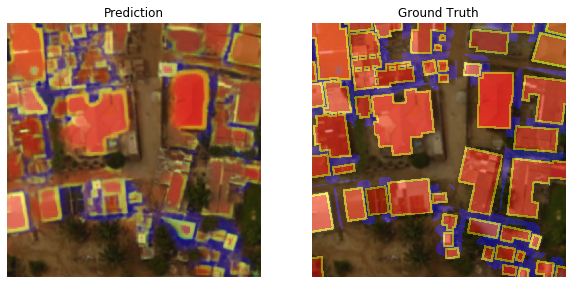

Predicted:


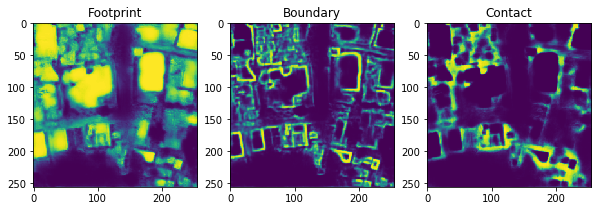

Actual:


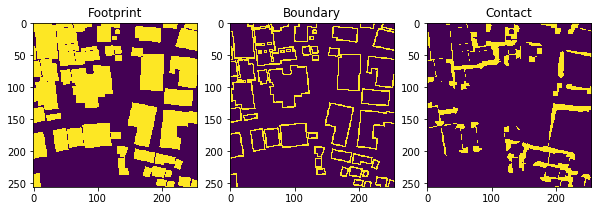

acc665946validation_19_261808_253936.png
loss: 0.7763020396232605


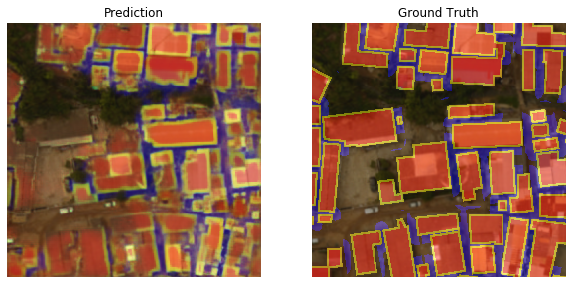

Predicted:


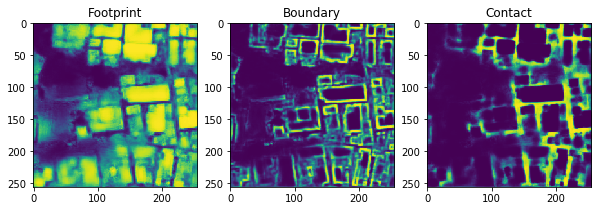

Actual:


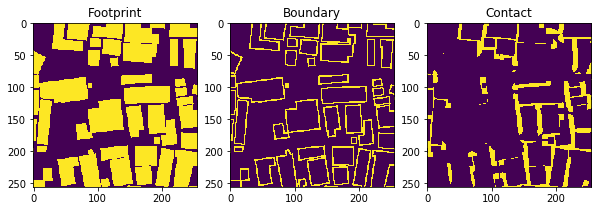

acc665946validation_19_261807_253937.png
loss: 0.7699105143547058


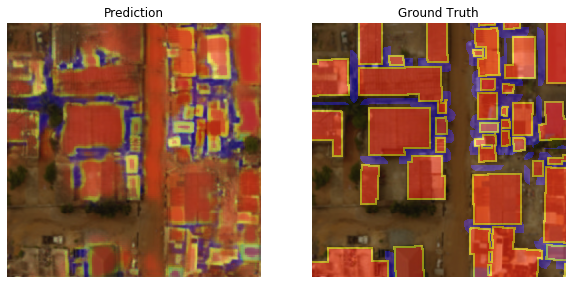

Predicted:


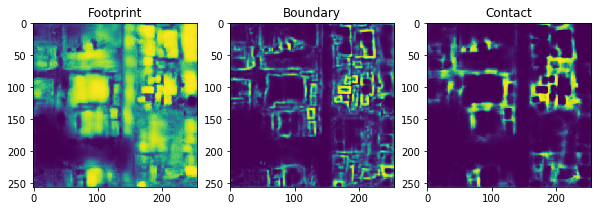

Actual:


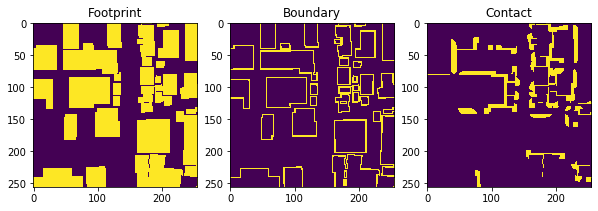

acc665946validation_19_261807_253936.png
loss: 0.7584943175315857


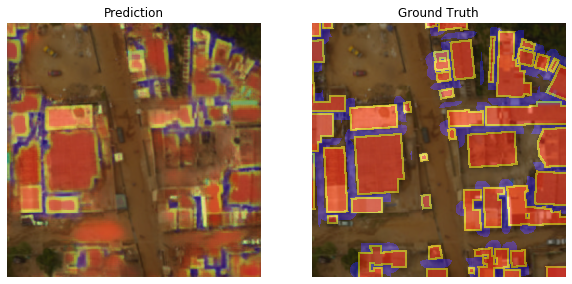

Predicted:


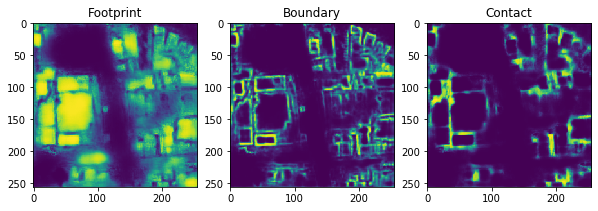

Actual:


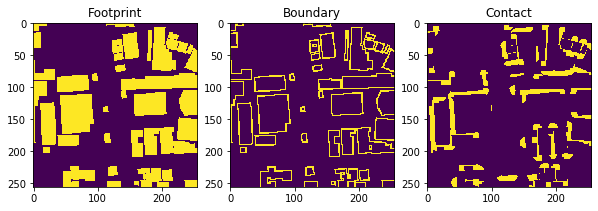

In [52]:
# look at predictions vs actual by channel sorted by highest image-wise loss first

for i in sorted_idx[:10]:

    print(f'{data.valid_ds.items[i].name}')
    print(f'loss: {losses_reshaped[i].mean()}')
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5))
    
    data.valid_ds.x[i].show(ax=ax1)
    ax1.set_title('Prediction')
    ax1.imshow(image2np(outputs[i].sigmoid()), alpha=0.4)
    
    ax2.set_title('Ground Truth')
    data.valid_ds.x[i].show(ax=ax2)
    ax2.imshow(image2np(labels[i])*255, alpha=0.4)
    plt.show()
    
    print('Predicted:')
    show_3ch(outputs[i].sigmoid())
    print('Actual:')
    show_3ch(labels[i])

In [0]:
learn.load('acc-665946-focaldice-stage1-best')
learn.model.train()
learn.unfreeze()

In [54]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


Min numerical gradient: 1.58E-06
Min loss divided by 10: 3.31E-05


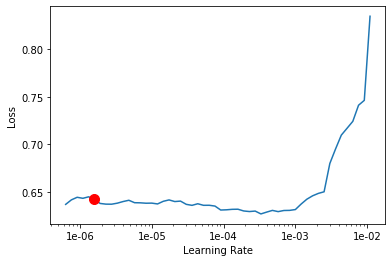

In [55]:
learn.recorder.plot(suggestion=True)

In [58]:
learn.fit_one_cycle(20, max_lr=slice(3e-6,3e-4), 
                    callbacks=[
                        SaveModelCallback(learn,
                                           monitor='dice_multich',
                                           mode='max',
                                           name='acc-665946-focaldice-unforzen-best')
                    ]
)

epoch,train_loss,valid_loss,acc_thresh_multich,dice_multich,acc_thresh_multich,dice_multich,time
0,0.633775,0.654605,0.913325,0.649410,0.887273,0.763830,00:15
1,0.641997,0.651498,0.912574,0.653241,0.885944,0.766962,00:15
2,0.641108,0.639108,0.918327,0.669368,0.889957,0.777386,00:15
3,0.628969,0.626859,0.925739,0.683041,0.899336,0.789404,00:15
4,0.614708,0.662672,0.927865,0.685633,0.896125,0.789413,00:15
5,0.607892,0.626630,0.915780,0.675169,0.904419,0.801385,00:15
6,0.602003,0.613078,0.919680,0.686289,0.907657,0.809571,00:15
7,0.593642,0.578907,0.930019,0.710826,0.914756,0.821245,00:15
8,0.581641,0.579856,0.930308,0.708736,0.917345,0.822876,00:15
9,0.568947,0.586804,0.933363,0.716558,0.917069,0.825894,00:15


Better model found at epoch 0 with dice_multich value: 0.763830304145813.
Better model found at epoch 1 with dice_multich value: 0.7669621109962463.
Better model found at epoch 2 with dice_multich value: 0.7773857116699219.
Better model found at epoch 3 with dice_multich value: 0.7894043326377869.
Better model found at epoch 4 with dice_multich value: 0.7894133925437927.
Better model found at epoch 5 with dice_multich value: 0.8013848066329956.
Better model found at epoch 6 with dice_multich value: 0.8095705509185791.
Better model found at epoch 7 with dice_multich value: 0.8212448358535767.
Better model found at epoch 8 with dice_multich value: 0.8228756785392761.
Better model found at epoch 9 with dice_multich value: 0.8258938193321228.
Better model found at epoch 11 with dice_multich value: 0.8368483781814575.
Better model found at epoch 12 with dice_multich value: 0.8383997678756714.
Better model found at epoch 15 with dice_multich value: 0.8423733115196228.
Better model found at e

In [59]:
learn.model.eval()
outputs,labels,losses = learn.get_preds(ds_type=DatasetType.Valid,n_batch=6,with_loss=True)
losses_reshaped = torch.mean(losses.view(outputs.shape[0],-1), dim=1)
sorted_idx = torch.argsort(losses_reshaped,descending=True)

acc665946validation_19_261809_253936.png
loss: 0.7337791323661804


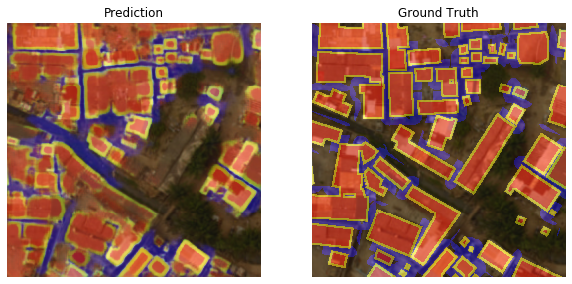

Predicted:


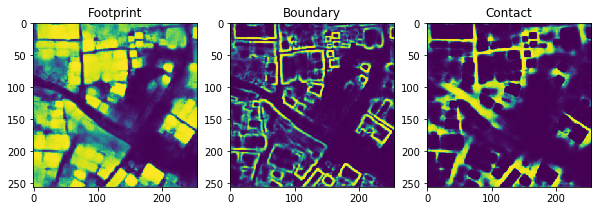

Actual:


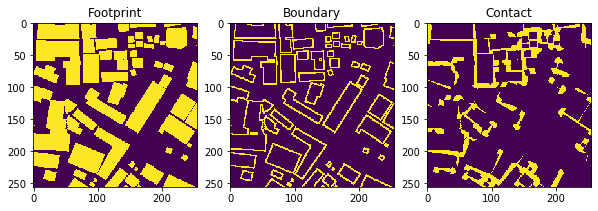

acc665946validation_19_261809_253937.png
loss: 0.7319499850273132


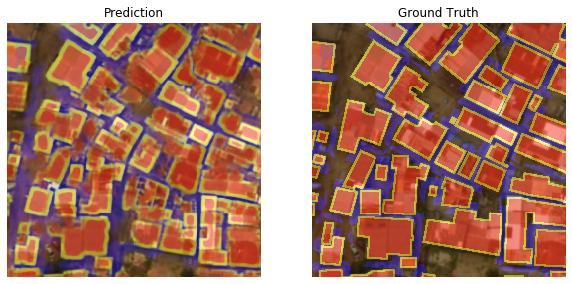

Predicted:


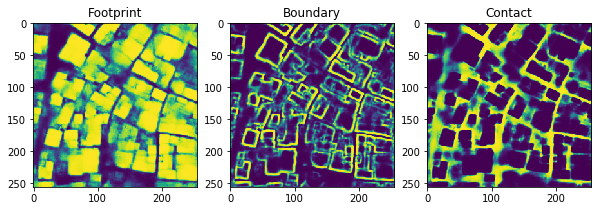

Actual:


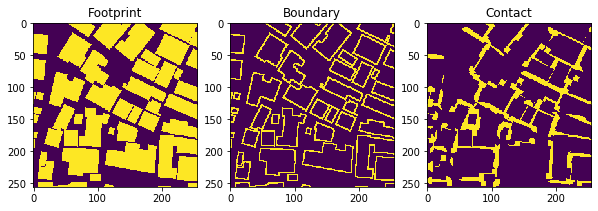

acc665946validation_19_261807_253942.png
loss: 0.7217022180557251


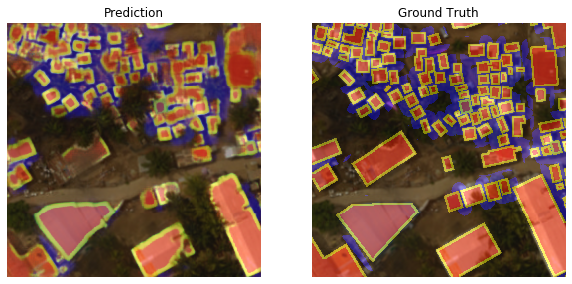

Predicted:


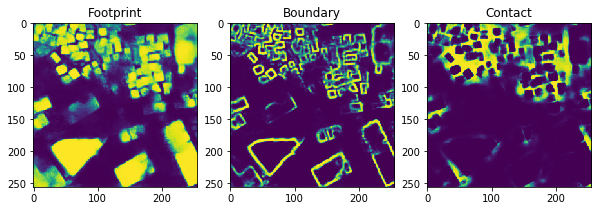

Actual:


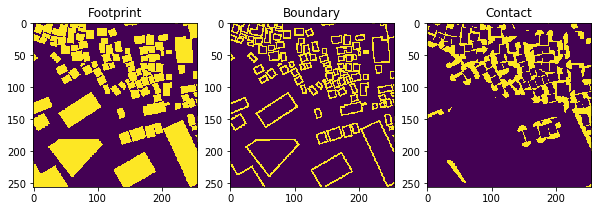

acc665946validation_19_261807_253941.png
loss: 0.7156068086624146


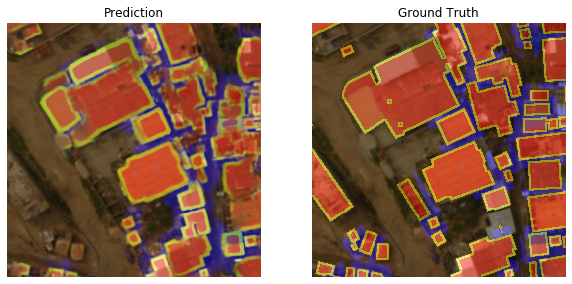

Predicted:


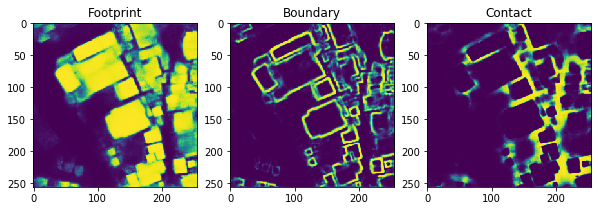

Actual:


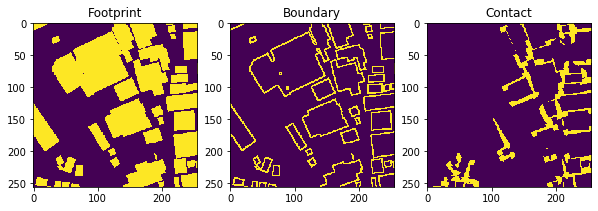

acc665946validation_19_261808_253937.png
loss: 0.7126221060752869


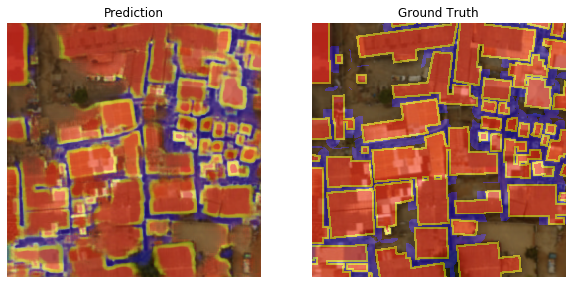

Predicted:


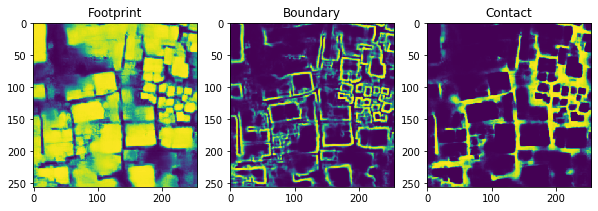

Actual:


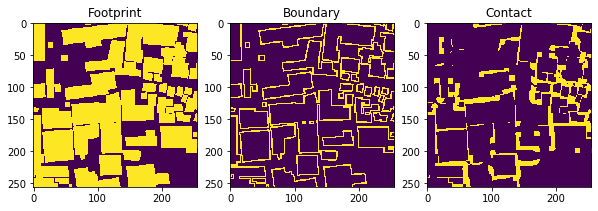

acc665946validation_19_261806_253941.png
loss: 0.6978094577789307


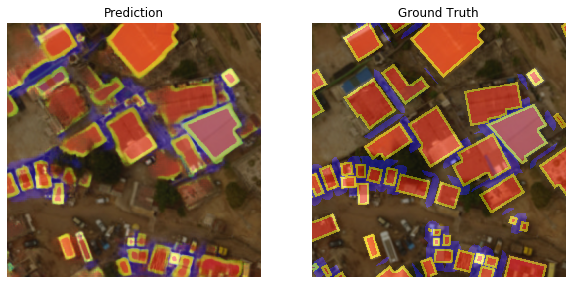

Predicted:


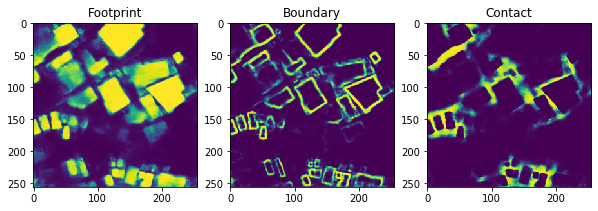

Actual:


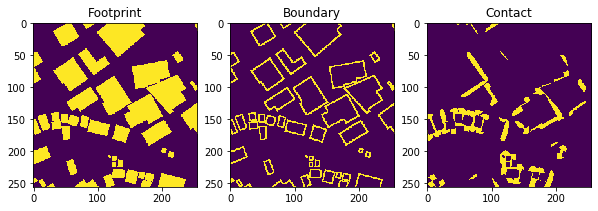

acc665946validation_19_261808_253935.png
loss: 0.6928104162216187


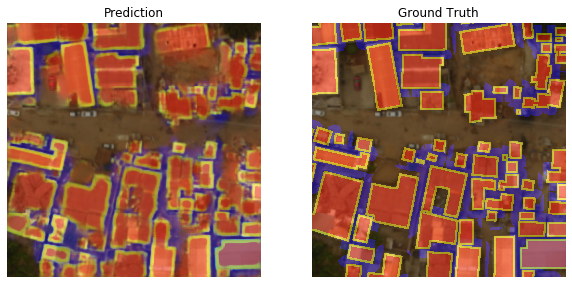

Predicted:


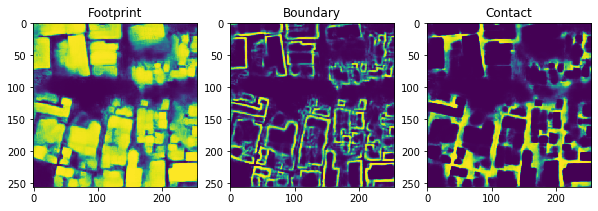

Actual:


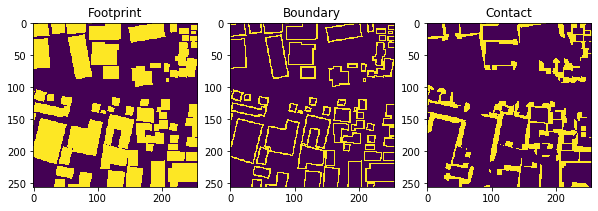

acc665946validation_19_261808_253936.png
loss: 0.6896342039108276


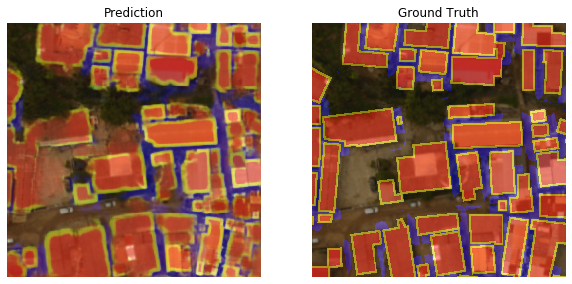

Predicted:


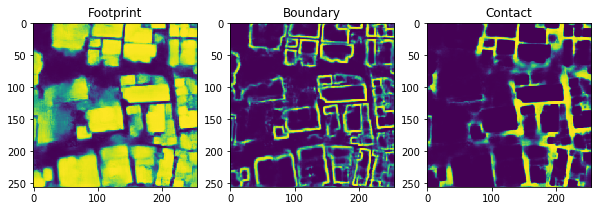

Actual:


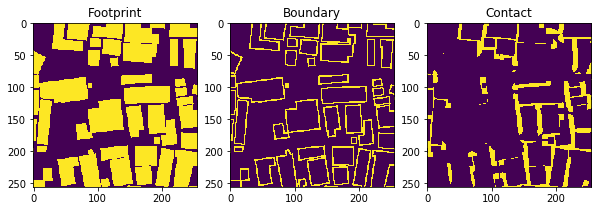

acc665946validation_19_261804_253935.png
loss: 0.6663365364074707


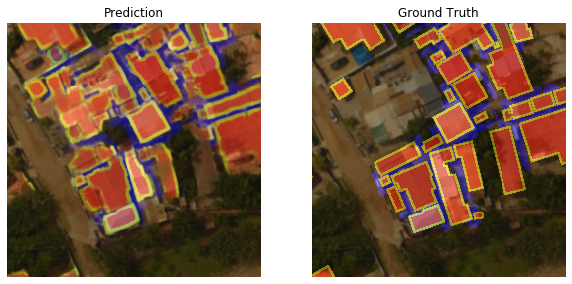

Predicted:


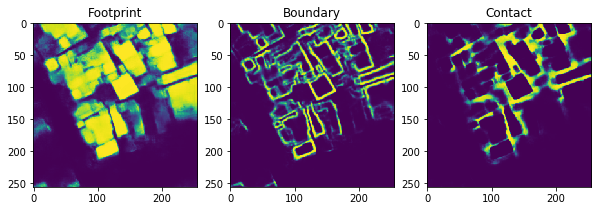

Actual:


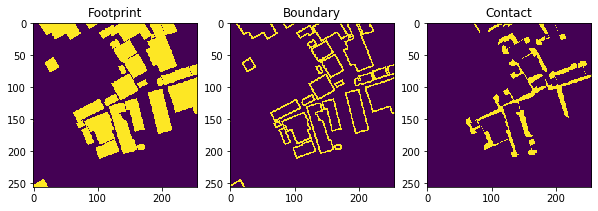

acc665946validation_19_261808_253941.png
loss: 0.6602963209152222


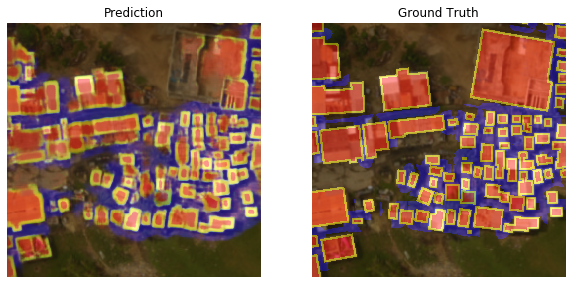

Predicted:


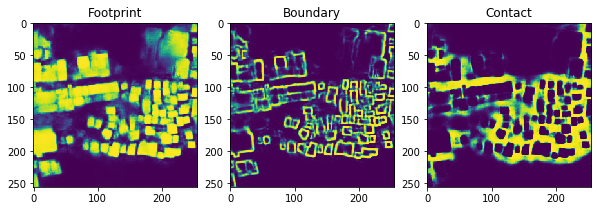

Actual:


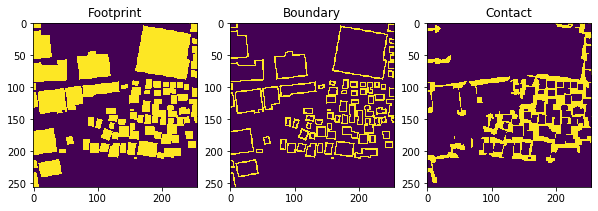

In [60]:
# look at predictions vs actual by channel sorted by highest image-wise loss first

for i in sorted_idx[:10]:

    print(f'{data.valid_ds.items[i].name}')
    print(f'loss: {losses_reshaped[i].mean()}')
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5))
    
    data.valid_ds.x[i].show(ax=ax1)
    ax1.set_title('Prediction')
    ax1.imshow(image2np(outputs[i].sigmoid()), alpha=0.4)
    
    ax2.set_title('Ground Truth')
    data.valid_ds.x[i].show(ax=ax2)
    ax2.imshow(image2np(labels[i])*255, alpha=0.4)
    plt.show()
    
    print('Predicted:')
    show_3ch(outputs[i].sigmoid())
    print('Actual:')
    show_3ch(labels[i])

In [0]:
# pickling with custom classes like MultiChComboLoss is a bit tricky 
# learn.export('../../../../models/znz001trn-focaldice.pkl')

In [0]:
inference_learner = load_learner(path='drive/My Drive/seg_building_foots/data/models/', file='acc-665946-focaldice-unfrozen.pkl')

In [0]:
from skimage import io
import time

def get_pred(learner, tile):
#     pdb.set_trace()
    t_img = Image(pil2tensor(tile[:,:,:3],np.float32).div_(255))
    outputs = learner.predict(t_img)
    im = image2np(outputs[2].sigmoid())
    im = (im*255).astype('uint8')
    return im

In [0]:
# try a different tile by changing or adding your own urls to list

urls = [
  'https://tiles.openaerialmap.org/5b1009f22b6a08001185f24a/0/5b1009f22b6a08001185f24b/19/319454/270706.png',
  'https://tiles.openaerialmap.org/5b1e6fd42b6a08001185f7bf/0/5b1e6fd42b6a08001185f7c0/20/569034/537093.png',
  'https://tiles.openaerialmap.org/5beaaba463f9420005ef8db0/0/5beaaba463f9420005ef8db1/19/313479/283111.png',
  'https://tiles.openaerialmap.org/5d050c3673de290005853a91/0/5d050c3673de290005853a92/18/203079/117283.png',
  'https://tiles.openaerialmap.org/5c88ff77225fc20007ab4e26/0/5c88ff77225fc20007ab4e27/21/1035771/1013136.png',
  'https://tiles.openaerialmap.org/5d30bac2e757aa0005951652/0/5d30bac2e757aa0005951653/19/136700/197574.png'
]

https://tiles.openaerialmap.org/5b1009f22b6a08001185f24a/0/5b1009f22b6a08001185f24b/19/319454/270706.png
GPU inference took 1.68 secs


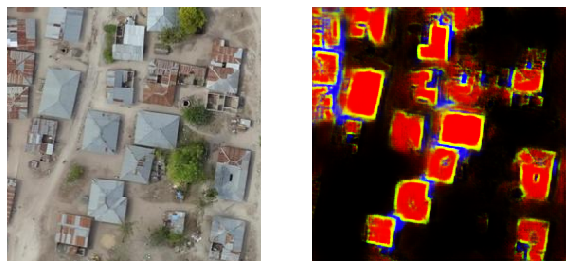

https://tiles.openaerialmap.org/5b1e6fd42b6a08001185f7bf/0/5b1e6fd42b6a08001185f7c0/20/569034/537093.png
GPU inference took 1.12 secs


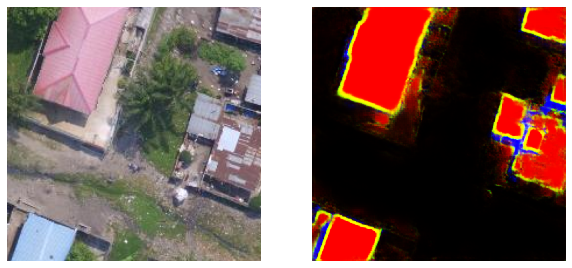

https://tiles.openaerialmap.org/5beaaba463f9420005ef8db0/0/5beaaba463f9420005ef8db1/19/313479/283111.png
GPU inference took 1.11 secs


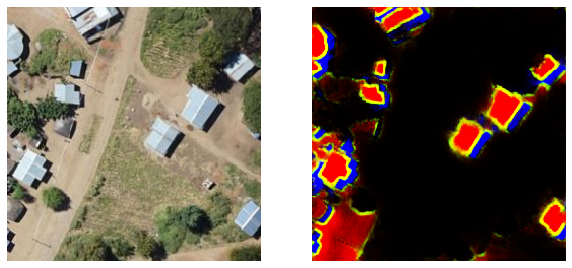

https://tiles.openaerialmap.org/5d050c3673de290005853a91/0/5d050c3673de290005853a92/18/203079/117283.png
GPU inference took 1.15 secs


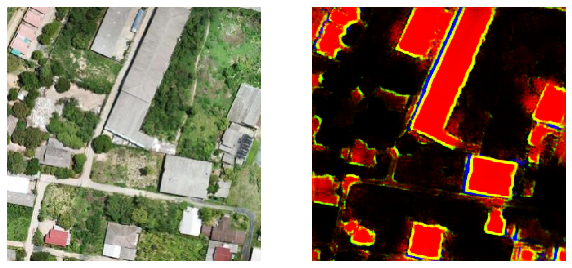

https://tiles.openaerialmap.org/5c88ff77225fc20007ab4e26/0/5c88ff77225fc20007ab4e27/21/1035771/1013136.png
GPU inference took 0.78 secs


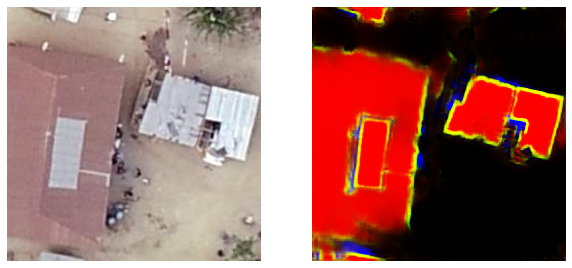

https://tiles.openaerialmap.org/5d30bac2e757aa0005951652/0/5d30bac2e757aa0005951653/19/136700/197574.png
GPU inference took 0.90 secs


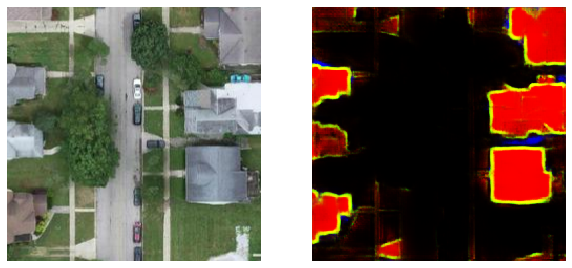

In [74]:
for url in urls:
  t1 = time.time()
  test_tile = io.imread(url)
  result = get_pred(inference_learner, test_tile)
  t2 = time.time()
  
  print(url)
  print(f'GPU inference took {t2-t1:.2f} secs')
  fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5))
  ax1.imshow(test_tile)
  ax2.imshow(result)
  ax1.axis('off')
  ax2.axis('off')
  plt.show()